In [69]:
import scipy.io
import cv2
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
import shutil
import math


In [30]:
random.seed(42)

In [47]:
def plot_side_by_side(img_1, img_2, title1="Original Image", title2="Processed Image"):
    """
    A function to plot two images side by side.
    """
    # if len(img_1.shape) == 3 or len(img_2.shape) == 3:
    #     img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)
    #     img_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)

    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    axs[0].imshow(img_1, cmap='gray')
    axs[1].imshow(img_2, cmap='gray')

    axs[0].set_title(title1)
    axs[1].set_title(title2)

In [3]:
images = []
folder = "HW2_Dataset"

for filename in os.listdir(folder):
    if filename.endswith(".JPG"):
        image_path = os.path.join(folder, filename)
        images.append(image_path)


print("Number of images: ", len(images))


Number of images:  58


In [6]:
resized_images = []
output_folder = "resized_images"

# Save the resized images to a new folder
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

for i, image_path in enumerate(images):
    img = cv2.imread(image_path)
    resized_img = cv2.resize(img, (224, 224))
    resized_images.append(resized_img)
    output_path = os.path.join(output_folder, f"resized_image_{i}.jpg")
    cv2.imwrite(output_path, resized_img)

print("Number of resized images: ", len(resized_images))



Number of resized images:  58


In [19]:
import ndjson
import os

# === Settings ===
input_file = "Export  project - HW2 - 4_16_2025.ndjson"
output_dir = "yolo_labels"
image_width, image_height = 224, 224
class_map = {"Camera": 0, "Headphones": 1}

# === Create output directory ===
os.makedirs(output_dir, exist_ok=True)

# === Load the NDJSON ===
with open(input_file, "r") as f:
    data = ndjson.load(f)

# === Process each entry ===
for entry in data:
    image_filename = entry["data_row"]["external_id"]
    image_id = os.path.splitext(image_filename)[0]
    
    # Extract annotations
    project_data = entry.get("projects", {})
    if not project_data:
        continue  # No labels
    
    # Grab the first project ID (there's usually only one)
    project_id = list(project_data.keys())[0]
    labels = project_data[project_id].get("labels", [])
    
    # Skip if no labels
    if not labels:
        continue
    
    # Write YOLO .txt for this image
    txt_path = os.path.join(output_dir, f"{image_id}.txt")
    with open(txt_path, "w") as out_file:
        for label_obj in labels:
            annotations = label_obj.get("annotations", [])
            # print(annotations)
                
            label = annotations["objects"][0]["name"]
            # print(label)
            if label not in class_map:
                continue

            # print(annotations)
            
            class_id = class_map[label]
            bbox = annotations["objects"][0]["bounding_box"]

            x_min = bbox["left"]
            y_min = bbox["top"]
            width = bbox["width"]
            height = bbox["height"]

            print(f"Image: {image_filename}, Class: {label}, BBox: {x_min}, {y_min}, {width}, {height}")

            x_center = (x_min + width / 2) / image_width
            y_center = (y_min + height / 2) / image_height
            width_norm = width / image_width
            height_norm = height / image_height

            out_file.write(f"{class_id} {x_center:.6f} {y_center:.6f} {width_norm:.6f} {height_norm:.6f}\n")

# === Save class names to file ===
with open(os.path.join(output_dir, "classes.txt"), "w") as f:
    for label in sorted(class_map, key=class_map.get):
        f.write(label + "\n")

print("✅ Done! YOLO .txt labels are saved in:", output_dir)


Image: resized_image_18.jpg, Class: Headphones, BBox: 36.0, 37.0, 157.0, 151.0
Image: resized_image_19.jpg, Class: Headphones, BBox: 47.0, 48.0, 143.0, 135.0
Image: resized_image_20.jpg, Class: Camera, BBox: 56.0, 59.0, 111.0, 99.0
Image: resized_image_21.jpg, Class: Camera, BBox: 65.0, 53.0, 95.0, 109.0
Image: resized_image_22.jpg, Class: Camera, BBox: 58.0, 60.0, 85.0, 99.0
Image: resized_image_23.jpg, Class: Camera, BBox: 65.0, 58.0, 79.0, 97.0
Image: resized_image_24.jpg, Class: Camera, BBox: 61.0, 77.0, 88.0, 92.0
Image: resized_image_25.jpg, Class: Camera, BBox: 39.0, 51.0, 141.0, 114.0
Image: resized_image_26.jpg, Class: Camera, BBox: 54.0, 54.0, 99.0, 108.0
Image: resized_image_27.jpg, Class: Camera, BBox: 55.0, 64.0, 93.0, 100.0
Image: resized_image_28.jpg, Class: Headphones, BBox: 46.0, 61.0, 125.0, 111.0
Image: resized_image_29.jpg, Class: Headphones, BBox: 42.0, 59.0, 126.0, 110.0
Image: resized_image_30.jpg, Class: Headphones, BBox: 47.0, 69.0, 122.0, 119.0
Image: resized_

<Figure size 1000x1000 with 0 Axes>

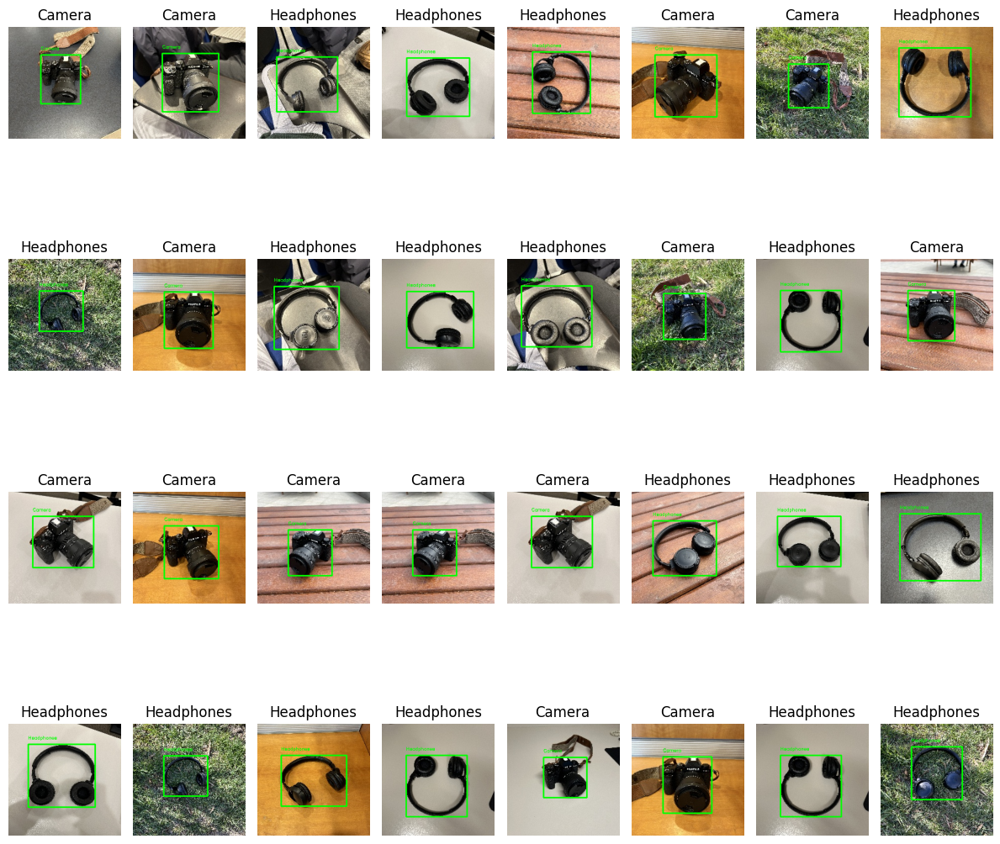

In [89]:
def visualize_bounding_box(image_path, label_file, classes):

    image = cv2.imread(image_path)

    # Read the bounding box information
    with open(label_file, "r") as file:
        lines = file.readlines()

    class_id, x_center, y_center, width_norm, height_norm = map(float, lines[0].split())

    # Calculate the bounding box coordinates
    image_width, image_height = image.shape[1], image.shape[0]
    x_min = int((x_center - width_norm / 2) * image_width)
    y_min = int((y_center - height_norm / 2) * image_height)
    width = int(width_norm * image_width)
    height = int(height_norm * image_height)

    # Draw the bounding box rectangle
    cv2.rectangle(image, (x_min, y_min), (x_min + width, y_min + height), (0, 255, 0), 2)

    # Label the image
    label = f"{classes[int(class_id)]}"
    cv2.putText(image, label, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0, 255, 0), 1)

    # Convert BGR image to RGB for matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    return image_rgb, label, (x_min, y_min, width, height)
    # Display the image with bounding box
    # plt.imshow(image_rgb)
    # plt.title("Bounding Box Visualization")
    # plt.axis('off')
    # plt.show()


classes = {0: "Camera", 1: "Headphones"}
plt.figure(figsize=(10, 10))

counter = 1

plt.figure(figsize=(12, 12))  # Adjust figure size

for i in range(32):
    random_index = random.randint(0, 58)
    image_path = "resized_images/resized_image_" + str(random_index) + ".jpg"
    label_file = "yolo_labels/resized_image_" + str(random_index) + ".txt"

    plt.subplot(4, 8, i+1)
    image_with_bbox, *info = visualize_bounding_box(image_path, label_file, classes)
    plt.imshow(image_with_bbox)  # Ensure correct format
    plt.axis('off')
    plt.title(info[0])  # Show the label

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


In [62]:
image_path = "resized_images/resized_image_0.jpg"
label_file = "yolo_labels/resized_image_0.txt"

image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

with open(label_file, "r") as file:
    lines = file.readlines()

class_id, x_center, y_center, width_norm, height_norm = map(float, lines[0].split())
print(class_id, x_center, y_center, width_norm, height_norm)

1.0 0.502232 0.515625 0.584821 0.450893


(47, 64, 130, 101)


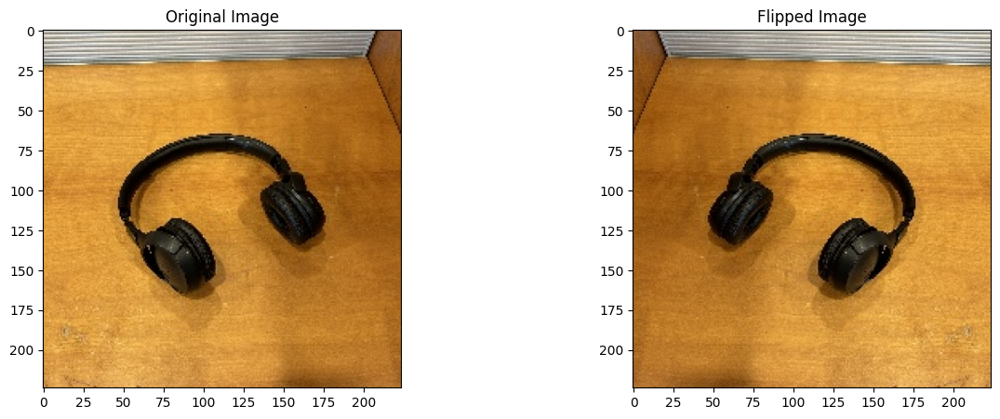

In [51]:
image_rgb_flipped_horizontally = cv2.flip(image_rgb, 1)  # Flip the image horizontally

plot_side_by_side(image_rgb, image_rgb_flipped_horizontally, title1="Original Image", title2="Horizontally Flipped Image")

x_center_flipped_hor = 1 - x_center
bounding_box_hor = [class_id, x_center_flipped_hor, y_center, width_norm, height_norm]


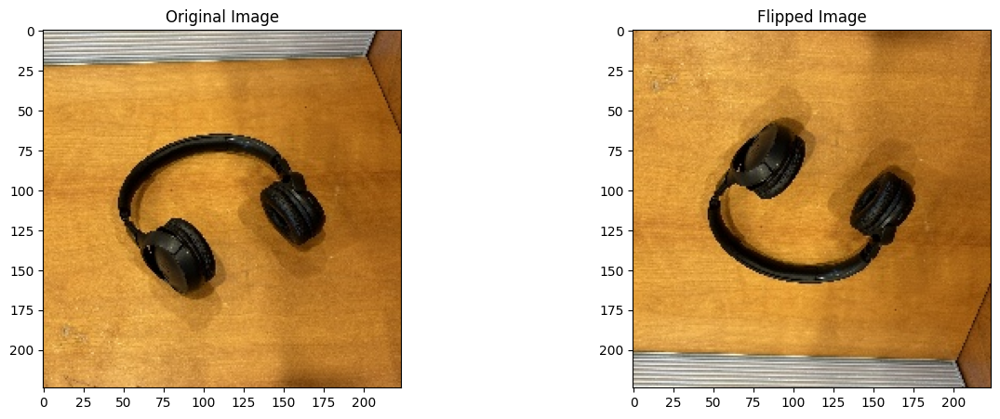

In [50]:
image_rgb_flipped_vertically = cv2.flip(image_rgb, 0)  # Flip the image vertically

plot_side_by_side(image_rgb, image_rgb_flipped_vertically, title1="Original Image", title2="Vertically Flipped Image")

x_center_flipped_ver = x_center
bounding_box_ver = [class_id, x_center_flipped_ver, y_center, width_norm, height_norm]

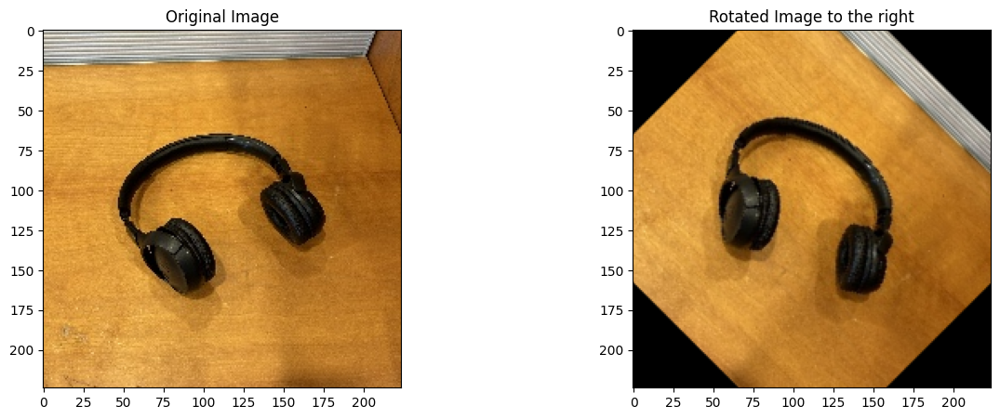

In [80]:
def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    (cX, cY) = (w // 2, h // 2)

    M = cv2.getRotationMatrix2D((cX, cY), angle, 1.0)
    img_rotated = cv2.warpAffine(image, M, (w, h))

    return img_rotated

rotated_to_right = rotate_image(image_rgb, -45)
plot_side_by_side(image_rgb, rotated_to_right, title1="Original Image", title2="Rotated Image to the right")


1 0.512627 0.509470 0.732360 0.732360


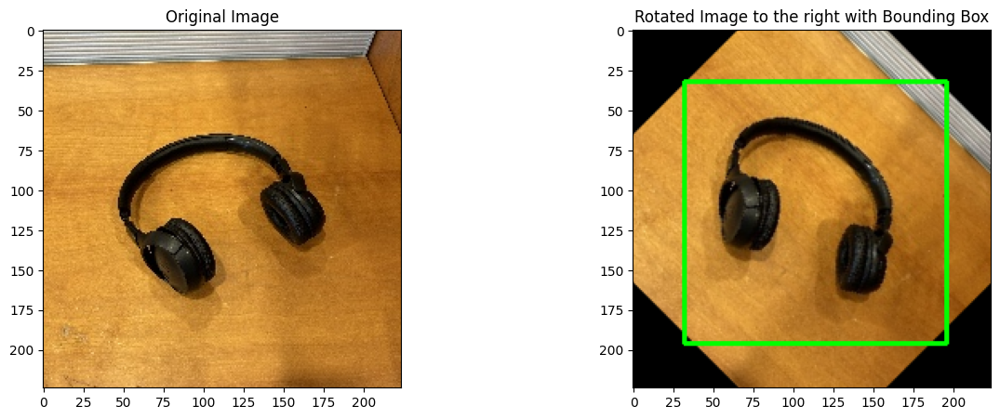

In [73]:
def rotate_point(x, y, cx, cy, angle_rad):
    cos_a = math.cos(angle_rad)
    sin_a = math.sin(angle_rad)
    x -= cx
    y -= cy
    x_new = x * cos_a + y * sin_a
    y_new = -x * sin_a + y * cos_a
    return x_new + cx, y_new + cy

def rotate_yolo_label(label_line, angle_deg=45, image_size=(224, 224)):
    W, H = image_size
    cx, cy = W / 2, H / 2
    angle_rad = math.radians(angle_deg)

    class_id, x_c, y_c, w, h = label_line.strip().split()
    x_c, y_c, w, h = float(x_c) * W, float(y_c) * H, float(w) * W, float(h) * H

    # Get corners of the original box
    x1, y1 = x_c - w / 2, y_c - h / 2
    x2, y2 = x_c + w / 2, y_c - h / 2
    x3, y3 = x_c + w / 2, y_c + h / 2
    x4, y4 = x_c - w / 2, y_c + h / 2

    corners = [(x1, y1), (x2, y2), (x3, y3), (x4, y4)]
    rotated = [rotate_point(x, y, cx, cy, angle_rad) for x, y in corners]

    # Get new AABB
    x_coords, y_coords = zip(*rotated)
    x_min, x_max = min(x_coords), max(x_coords)
    y_min, y_max = min(y_coords), max(y_coords)

    # Convert back to YOLO format
    new_x_c = (x_min + x_max) / 2 / W
    new_y_c = (y_min + y_max) / 2 / H
    new_w = (x_max - x_min) / W
    new_h = (y_max - y_min) / H

    return f"{class_id} {new_x_c:.6f} {new_y_c:.6f} {new_w:.6f} {new_h:.6f}"


rotated_line = rotate_yolo_label("1 0.502232 0.515625 0.584821 0.450893", angle_deg=45)
print(rotated_line)

class_id, x_center, y_center, width_norm, height_norm = rotated_line.strip().split()
x_center, y_center, width_norm, height_norm = map(float, [x_center, y_center, width_norm, height_norm])

x_min = int((x_center - width_norm / 2) * image_width)
y_min = int((y_center - height_norm / 2) * image_height)
width = int(width_norm * image_width)
height = int(height_norm * image_height)

    # Draw the bounding box rectangle
cv2.rectangle(rotated_to_right, (x_min, y_min), (x_min + width, y_min + height), (0, 255, 0), 2)
plot_side_by_side(image_rgb, rotated_to_right, title1="Original Image", title2="Rotated Image to the right with Bounding Box")  

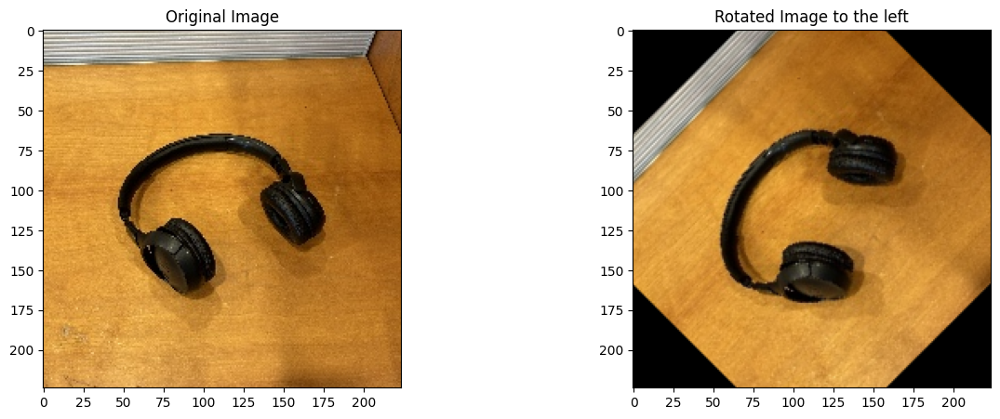

In [81]:
rotated_to_left = rotate_image(image_rgb, 45)

plot_side_by_side(image_rgb, rotated_to_left, title1="Original Image", title2="Rotated Image to the left")

1 0.490530 0.512627 0.732360 0.732360


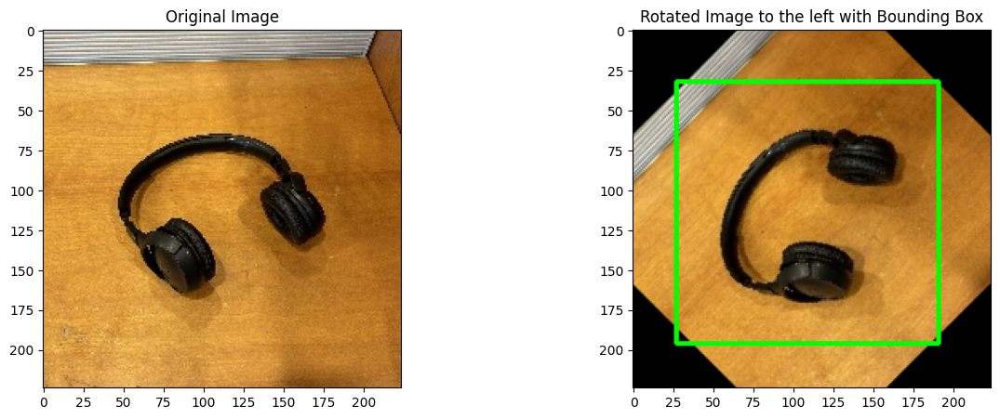

In [82]:
rotated_line = rotate_yolo_label("1 0.502232 0.515625 0.584821 0.450893", angle_deg=-45)
print(rotated_line)

class_id, x_center, y_center, width_norm, height_norm = rotated_line.strip().split()
x_center, y_center, width_norm, height_norm = map(float, [x_center, y_center, width_norm, height_norm])

x_min = int((x_center - width_norm / 2) * image_width)
y_min = int((y_center - height_norm / 2) * image_height)
width = int(width_norm * image_width)
height = int(height_norm * image_height)

    # Draw the bounding box rectangle
cv2.rectangle(rotated_to_left, (x_min, y_min), (x_min + width, y_min + height), (0, 255, 0), 2)
plot_side_by_side(image_rgb, rotated_to_left, title1="Original Image", title2="Rotated Image to the left with Bounding Box")  

In [75]:
images = []
folder = "resized_images"

for filename in os.listdir(folder):
    if filename.endswith(".jpg"):
        image_path = os.path.join(folder, filename)
        images.append(image_path)


print("Number of images: ", len(images))

Number of images:  58


In [77]:
labels = []
folder = "yolo_labels"

for filename in os.listdir(folder):
    if filename.endswith(".txt"):
        label_path = os.path.join(folder, filename)
        labels.append(label_path)

print("Number of labels: ", len(labels))

Number of labels:  58


In [84]:
with open('yolo_labels/resized_image_0.txt', "r") as file:
    lines = file.readlines()

print(lines[0])

1 0.502232 0.515625 0.584821 0.450893



In [86]:
dataset_before_augmentation = list(zip(images, labels))

folder = "augmented_images_1"
counter = 1

for image, path in dataset_before_augmentation:
    print(image, path)
    
    image_rgb = cv2.imread(image)
    # First we save the image with its label
    cv2.imwrite(f"augmented_images_1/image_{counter}.jpg", image_rgb)
    with open(path, "r") as file:
        lines = file.readlines()
    with open(f"augmented_images_1/image_{counter}.txt", "w") as file:
        for line in lines:
            file.write(line)
    counter += 1

    # Now we can augment the images

    label, x_center, y_center, width_norm, height_norm = lines[0].strip().split()
    x_center, y_center, width_norm, height_norm = map(float, [x_center, y_center, width_norm, height_norm])

    # Horizontally flipped
    image_rgb_flipped_horizontally = cv2.flip(image_rgb, 1)  # Flip the image horizontally
    cv2.imwrite(f"augmented_images_1/image_{counter}.jpg", image_rgb_flipped_horizontally)

    x_center_flipped_hor = 1 - x_center

    with open(f"augmented_images_1/image_{counter}.txt", "w") as file:
        file.write(f"{label} {x_center_flipped_hor:.6f} {y_center:.6f} {width_norm:.6f} {height_norm:.6f}\n")
    counter += 1

    # Vertically flipped

    image_rgb_flipped_vertically = cv2.flip(image_rgb, 0)  # Flip the image vertically
    cv2.imwrite(f"augmented_images_1/image_{counter}.jpg", image_rgb_flipped_vertically)
    
    y_center_flipped_ver = 1 - y_center

    with open(f"augmented_images_1/image_{counter}.txt", "w") as file:
        file.write(f"{label} {x_center:.6f} {y_center_flipped_ver:.6f} {width_norm:.6f} {height_norm:.6f}\n")
    counter += 1

    # Rotated to the right
    rotated_to_right = rotate_image(image_rgb, -45)
    cv2.imwrite(f"augmented_images_1/image_{counter}.jpg", rotated_to_right)

    rotated_line_right = rotate_yolo_label(lines[0].strip(), angle_deg=-45)

    with open(f"augmented_images_1/image_{counter}.txt", "w") as file:
        file.write(rotated_line_right + "\n")
    counter += 1

    # Rotated to the left
    rotated_to_left = rotate_image(image_rgb, 45)
    cv2.imwrite(f"augmented_images_1/image_{counter}.jpg", rotated_to_left)

    rotated_line_left = rotate_yolo_label(lines[0].strip(), angle_deg=45)

    with open(f"augmented_images_1/image_{counter}.txt", "w") as file:
        file.write(rotated_line_left + "\n")
    counter += 1

resized_images\resized_image_0.jpg yolo_labels\resized_image_0.txt
resized_images\resized_image_1.jpg yolo_labels\resized_image_1.txt
resized_images\resized_image_10.jpg yolo_labels\resized_image_10.txt
resized_images\resized_image_11.jpg yolo_labels\resized_image_11.txt
resized_images\resized_image_12.jpg yolo_labels\resized_image_12.txt
resized_images\resized_image_13.jpg yolo_labels\resized_image_13.txt
resized_images\resized_image_14.jpg yolo_labels\resized_image_14.txt
resized_images\resized_image_15.jpg yolo_labels\resized_image_15.txt
resized_images\resized_image_16.jpg yolo_labels\resized_image_16.txt
resized_images\resized_image_17.jpg yolo_labels\resized_image_17.txt
resized_images\resized_image_18.jpg yolo_labels\resized_image_18.txt
resized_images\resized_image_19.jpg yolo_labels\resized_image_19.txt
resized_images\resized_image_2.jpg yolo_labels\resized_image_2.txt
resized_images\resized_image_20.jpg yolo_labels\resized_image_20.txt
resized_images\resized_image_21.jpg yolo

<Figure size 1000x1000 with 0 Axes>

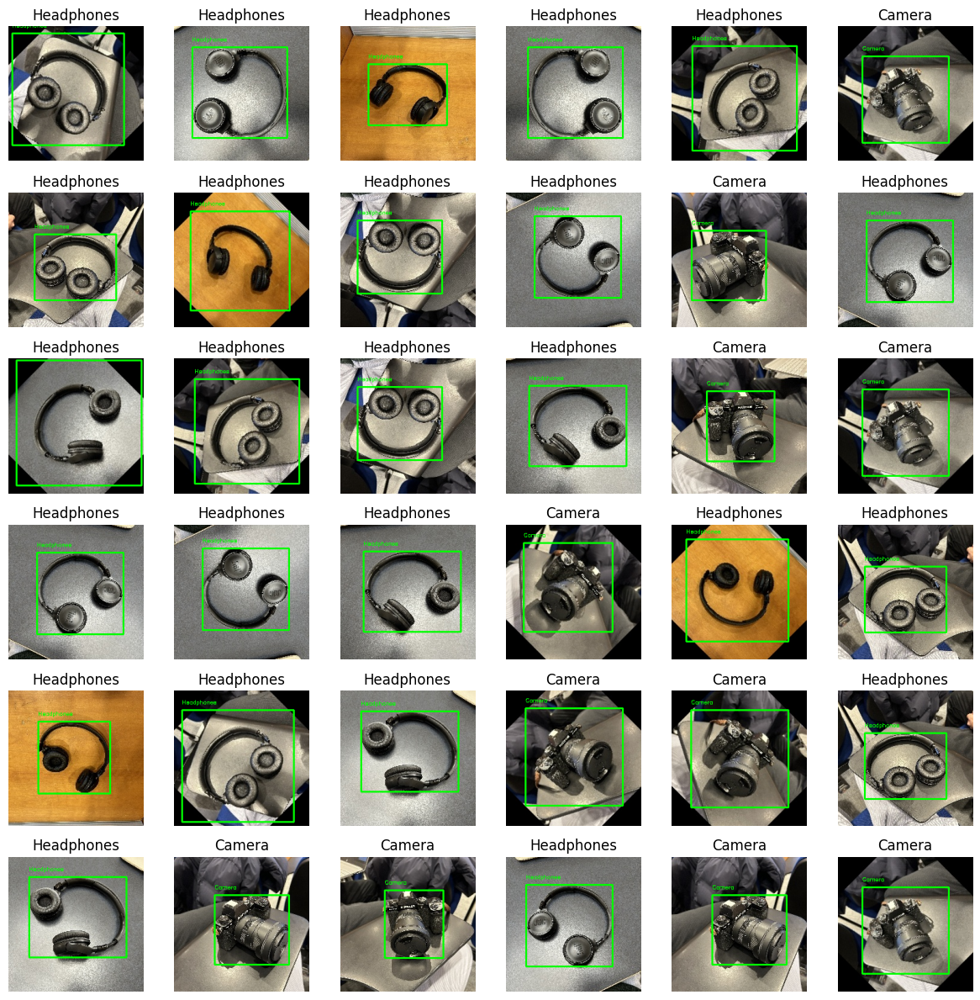

In [88]:
classes = {0: "Camera", 1: "Headphones"}
plt.figure(figsize=(10, 10))

counter = 1

plt.figure(figsize=(12, 12))  # Adjust figure size

for i in range(36):
    random_index = random.randint(0, 58)
    image_path = "augmented_images_1/image_" + str(random_index) + ".jpg"
    label_file = "augmented_images_1/image_" + str(random_index) + ".txt"

    plt.subplot(6, 6, i+1)
    image_with_bbox, *info = visualize_bounding_box(image_path, label_file, classes)
    plt.imshow(image_with_bbox)  # Ensure correct format
    plt.axis('off')
    plt.title(info[0])  # Show the label

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

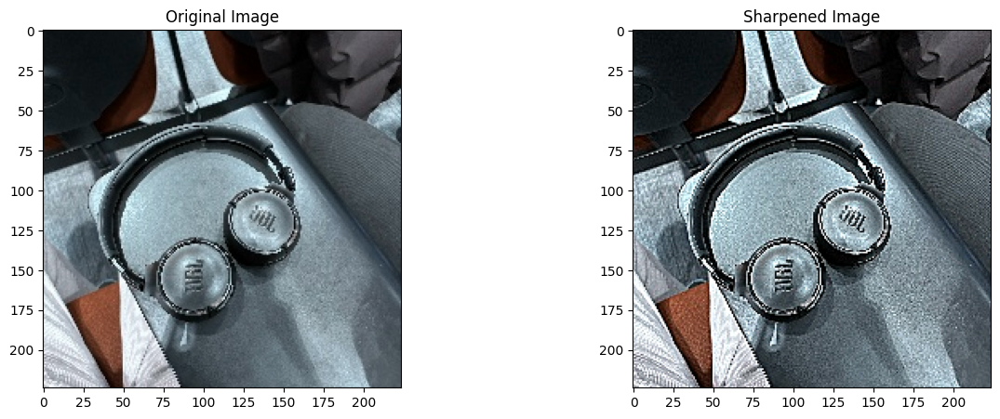

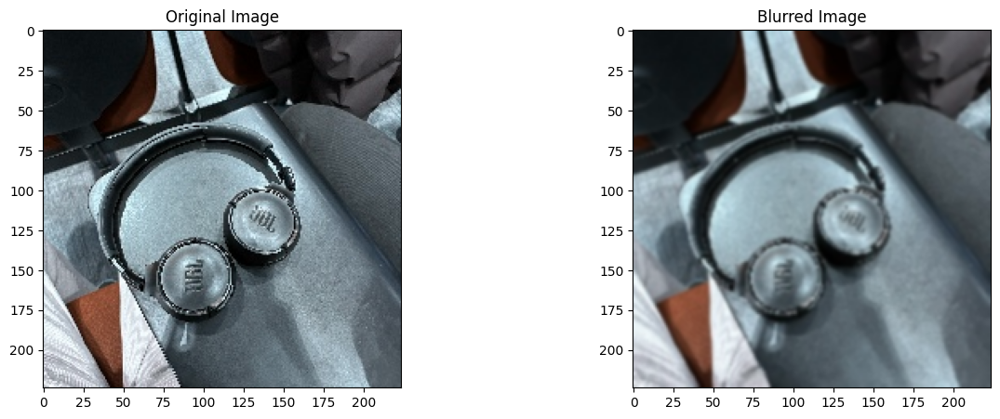

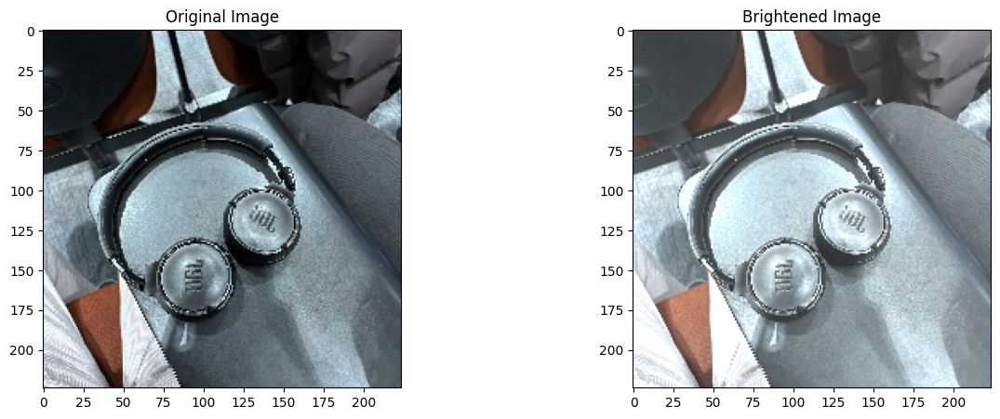

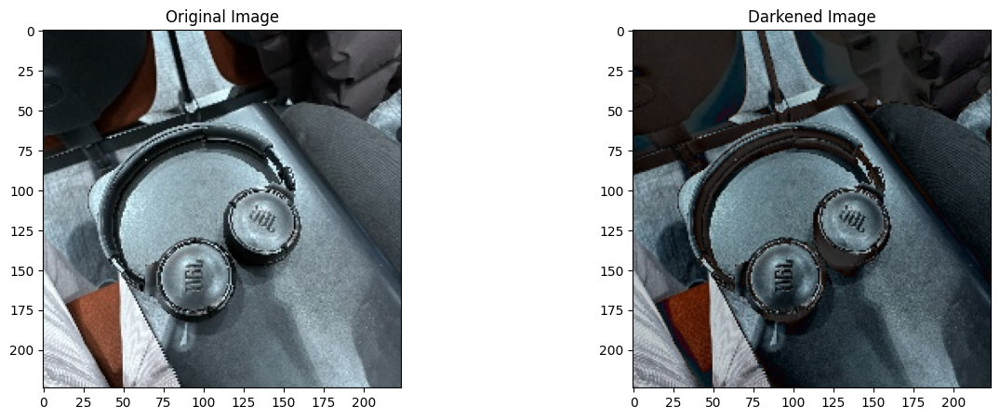

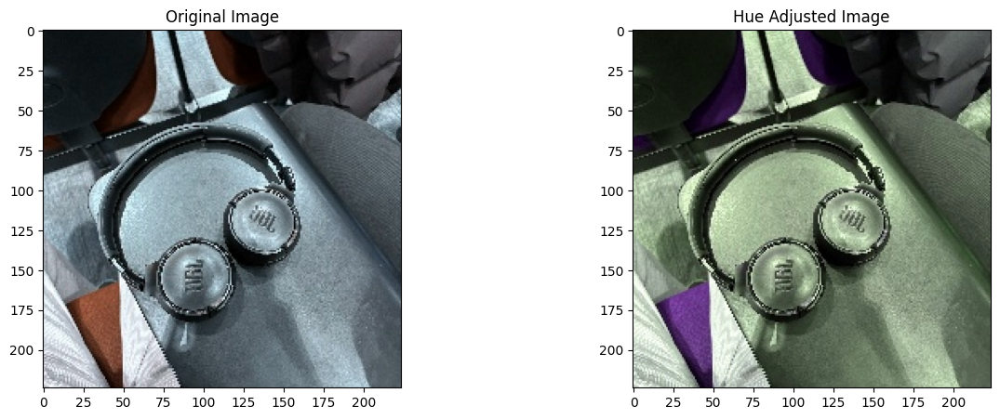

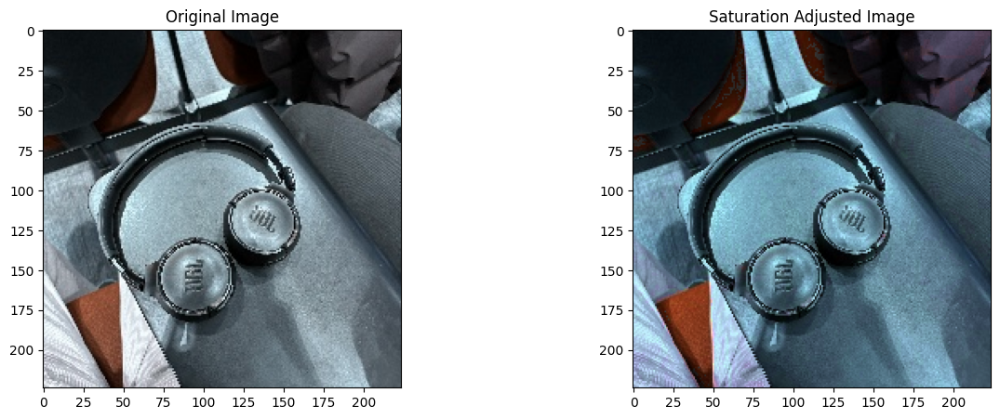

In [102]:
def sharpen_image(image):
    blurred = cv2.GaussianBlur(image, (0, 0), 1)
    # Subtract the blurred image from the original
    sharpened = cv2.addWeighted(image, 1.0 + 1.5, blurred, -1.5, 0)
    return sharpened


def blur_image(image):
    blurred = cv2.GaussianBlur(image, (0, 0), 1)
    return blurred


def brighten_image(image):
    brightened = cv2.convertScaleAbs(image, alpha=1, beta=50)
    return brightened


def darken_image(image):
    darkened = cv2.convertScaleAbs(image, alpha=1, beta=-50)
    return darkened


def adjust_hue(image, delta):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    h = (h + delta) % 180
    hsv = cv2.merge((h, s, v))
    adjusted_image = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    return adjusted_image


def adjust_saturation(image, delta):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    s = np.clip(s + delta, 0, 255)
    hsv = cv2.merge((h, s, v))
    adjusted_image = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    return adjusted_image

plot_side_by_side(image_rgb, sharpen_image(image_rgb), title1="Original Image", title2="Sharpened Image")
plot_side_by_side(image_rgb, blur_image(image_rgb), title1="Original Image", title2="Blurred Image")
plot_side_by_side(image_rgb, brighten_image(image_rgb), title1="Original Image", title2="Brightened Image")
plot_side_by_side(image_rgb, darken_image(image_rgb), title1="Original Image", title2="Darkened Image")
plot_side_by_side(image_rgb, adjust_hue(image_rgb, 50), title1="Original Image", title2="Hue Adjusted Image")
plot_side_by_side(image_rgb, adjust_saturation(image_rgb, 50), title1="Original Image", title2="Saturation Adjusted Image")

In [103]:
images = []
folder = "augmented_images_1"

for filename in os.listdir(folder):
    if filename.endswith(".jpg"):
        image_path = os.path.join(folder, filename)
        images.append(image_path)


print("Number of images: ", len(images))

labels = []
folder = "augmented_images_1"

for filename in os.listdir(folder):
    if filename.endswith(".txt"):
        label_path = os.path.join(folder, filename)
        labels.append(label_path)

print("Number of labels: ", len(labels))

Number of images:  290
Number of labels:  290


In [107]:
dataset_after_some_augmentation = list(zip(images, labels))

folder = "final_dataset"
counter = 1

def save_label(path, lines):
    with open(path, "w") as file:
        for line in lines:
            file.write(line)


for image, path in dataset_after_some_augmentation:
    
    image_rgb = cv2.imread(image)
    # First we save the image with its label
    cv2.imwrite(folder + f"/image_{counter}.jpg", image_rgb)
    with open(path, "r") as file:
        lines = file.readlines()
    save_label(folder + f"/image_{counter}.txt", lines)
    counter += 1

    # Now we can augment the images

    # sharpened

    image_rgb_sharpened = sharpen_image(image_rgb)
    cv2.imwrite(folder + f"/image_{counter}.jpg", image_rgb_sharpened)
    save_label(folder + f"/image_{counter}.txt", lines)
    counter += 1

    # blurred

    image_rgb_blurred = blur_image(image_rgb)
    cv2.imwrite(folder + f"/image_{counter}.jpg", image_rgb_blurred)
    save_label(folder + f"/image_{counter}.txt", lines)
    counter += 1

    # brightened

    image_rgb_brightened = brighten_image(image_rgb)
    cv2.imwrite(folder + f"/image_{counter}.jpg", image_rgb_brightened)
    save_label(folder + f"/image_{counter}.txt", lines)
    counter += 1

    # darkened

    image_rgb_darkened = darken_image(image_rgb)
    cv2.imwrite(folder + f"/image_{counter}.jpg", image_rgb_darkened)
    save_label(folder + f"/image_{counter}.txt", lines)
    counter += 1

    # hue adjusted

    image_rgb_hue_adjusted = adjust_hue(image_rgb, 50)
    cv2.imwrite(folder + f"/image_{counter}.jpg", image_rgb_hue_adjusted)
    save_label(folder + f"/image_{counter}.txt", lines)
    counter += 1

    # saturation adjusted

    image_rgb_saturation_adjusted = adjust_saturation(image_rgb, 50)
    cv2.imwrite(folder + f"/image_{counter}.jpg", image_rgb_saturation_adjusted)
    save_label(folder + f"/image_{counter}.txt", lines)
    counter += 1


<Figure size 1000x1000 with 0 Axes>

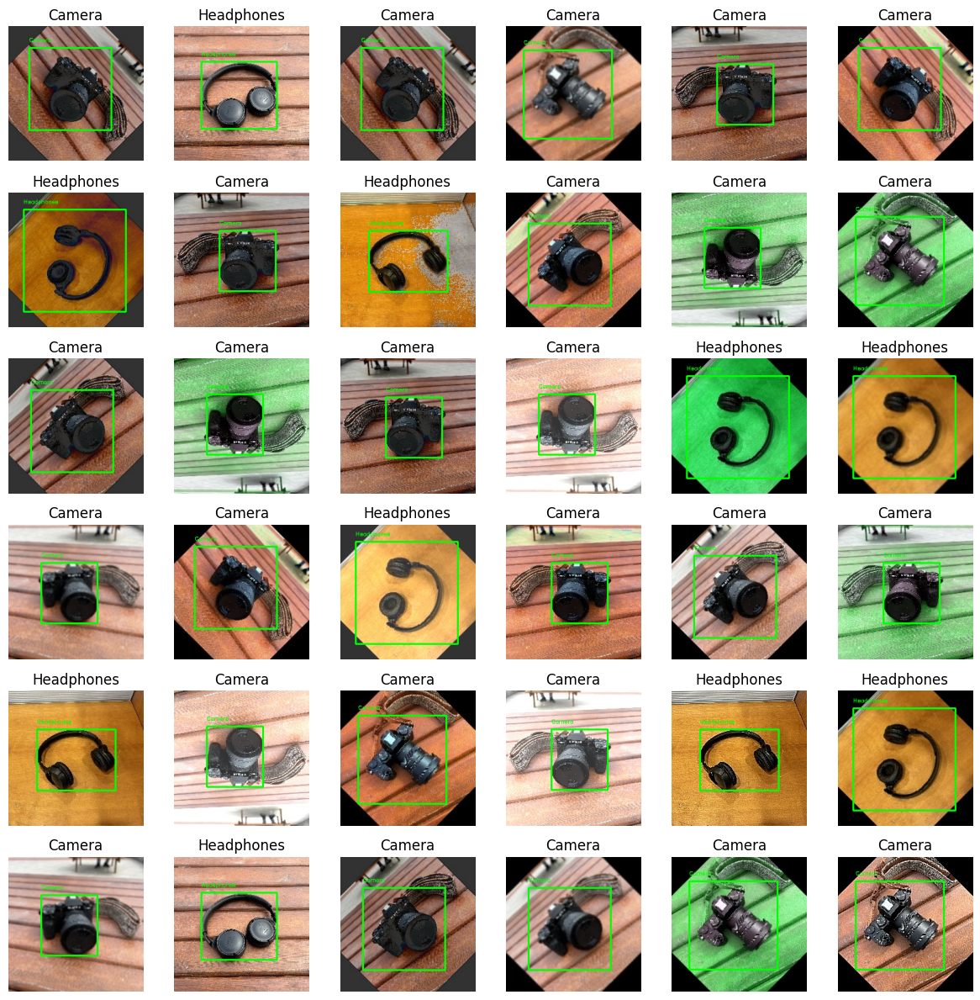

In [109]:
classes = {0: "Camera", 1: "Headphones"}
plt.figure(figsize=(10, 10))

counter = 1

plt.figure(figsize=(12, 12))  # Adjust figure size

for i in range(36):
    random_index = random.randint(1, 58)
    image_path = "final_dataset/image_" + str(random_index) + ".jpg"
    label_file = "final_dataset/image_" + str(random_index) + ".txt"

    plt.subplot(6, 6, i+1)
    image_with_bbox, *info = visualize_bounding_box(image_path, label_file, classes)
    plt.imshow(image_with_bbox)  # Ensure correct format
    plt.axis('off')
    plt.title(info[0])  # Show the label

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

In [ ]:
# Paths
SOURCE_DIR = "final_dataset"
DEST_DIR = "dataset"
IMAGE_EXT = ".jpg"
LABEL_EXT = ".txt"

# Create destination directories
splits = ['train', 'val', 'test']
for split in splits:
    os.makedirs(os.path.join(DEST_DIR, 'images', split), exist_ok=True)
    os.makedirs(os.path.join(DEST_DIR, 'labels', split), exist_ok=True)

# Get base filenames (without extension)
all_files = [f for f in os.listdir(SOURCE_DIR) if f.endswith(IMAGE_EXT)]
base_names = [os.path.splitext(f)[0] for f in all_files]
base_names.sort()  # Optional, you could randomize without sort

# Shuffle and split
random.shuffle(base_names)
total = len(base_names)
train_split = int(0.6 * total)
val_split = int(0.2 * total)

train_files = base_names[:train_split]
val_files = base_names[train_split:train_split + val_split]
test_files = base_names[train_split + val_split:]

# Copy files to split folders
def copy_files(file_list, split):
    for name in file_list:
        img_src = os.path.join(SOURCE_DIR, name + IMAGE_EXT)
        lbl_src = os.path.join(SOURCE_DIR, name + LABEL_EXT)

        img_dst = os.path.join(DEST_DIR, 'images', split, name + IMAGE_EXT)
        lbl_dst = os.path.join(DEST_DIR, 'labels', split, name + LABEL_EXT)

        if os.path.exists(img_src) and os.path.exists(lbl_src):
            shutil.copy(img_src, img_dst)
            shutil.copy(lbl_src, lbl_dst)

copy_files(train_files, 'train')
copy_files(val_files, 'val')
copy_files(test_files, 'test')

print(f"Dataset split completed:")
print(f"- Train: {len(train_files)}")
print(f"- Val:   {len(val_files)}")
print(f"- Test:  {len(test_files)}")